In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import numpy as np
fpath = './network_backup_dataset.csv'
import numpy as np
from surprise import Dataset
from surprise import Reader
from surprise import KNNWithMeans
from surprise.model_selection import cross_validate
import pickle
from tqdm import tqdm
import plotly as py
from plotly.offline import init_notebook_mode
import plotly.graph_objs as go
py.offline.init_notebook_mode(connected=True)

In [2]:
'''load data'''
backup = pd.read_csv(fpath)
#print(backup.shape) #(18588, 7)
#print(backup[:5])
'''grouping data'''
backup_group = backup.groupby([backup.columns[0], backup.columns[1], backup.columns[3]], sort=False).sum().iloc[:,1:2]
#converting categorical vars into numerical values
import calendar
days = dict(zip(calendar.day_name,range(1,8)))


backup['Day of Week'] = backup['Day of Week'].apply(lambda s: days[s])

#dropping back up time as asked in question
backup.drop('Backup Time (hour)', axis=1, inplace=True)

#fetching only the numeric part of each work_flow_id and file_name_number
f = lambda s: int(s[s.rindex('_')+1:])

backup['Work-Flow-ID'] = backup['Work-Flow-ID'].apply(f)
backup['File Name'] = backup['File Name'].apply(f)
#backup.head()
Xs = backup.iloc[:, list(range(5))].values
ys = backup.iloc[:, 5].values

In [3]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_validate
from sklearn.metrics import mean_squared_error
from sklearn.metrics import SCORERS
from math import sqrt
import warnings
from tqdm import tqdm
warnings.filterwarnings('ignore')
def randomForest(model, X, y):
    kf = KFold(n_splits=10)
    rmse_train, rmse_test, oob_error = 0, 0, 0
    for train_index, test_index in kf.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        model.fit(X_train, y_train)
        rmse_train += sqrt(mean_squared_error(y_train, model.predict(X_train)))
        rmse_test += sqrt(mean_squared_error(y_test, model.predict(X_test)))
        oob_error += 1 - model.oob_score_
    return rmse_train / 10, rmse_test / 10, oob_error/10

###SET parameters for Random forest
n_estimators = 20
max_depth = 4
bootstrap = True
max_features = 5
RF = RandomForestRegressor(n_estimators = n_estimators, max_depth = max_depth, max_features = max_features, bootstrap = True, oob_score=True)
#print(SCORERS.keys())
rmse_train, rmse_test, oob_error = randomForest(RF, Xs, ys)


In [4]:
#print(RF.oob_score_)
print(RF)
print(rmse_train, rmse_test, oob_error)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=4,
           max_features=5, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           n_estimators=20, n_jobs=None, oob_score=True, random_state=None,
           verbose=0, warm_start=False)
0.060446571493152274 0.06057906490373224 0.33978338325583624


In [91]:
import warnings
from tqdm import tqdm
warnings.filterwarnings('ignore')
rmse_train_arr, rmse_test_arr, oob_arr = [],[],[]
rmse_train, rmse_test, oob_error = randomForest(RF, Xs, ys)

for num_feat in tqdm(range(1,6)):
    rmse_train_arr.append([])
    rmse_test_arr.append([])
    oob_arr.append([])
    for num_trees in range(1,201):
        RF = RandomForestRegressor(n_estimators = num_trees, max_depth = max_depth, max_features = num_feat, bootstrap = True, oob_score=True)
        a, b, c = randomForest(RF,Xs,ys)
        rmse_train_arr[num_feat-1].append(a)
        rmse_test_arr[num_feat-1].append(b)
        oob_arr[num_feat-1].append(c)





100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [1:32:25<00:00, 1172.29s/it]


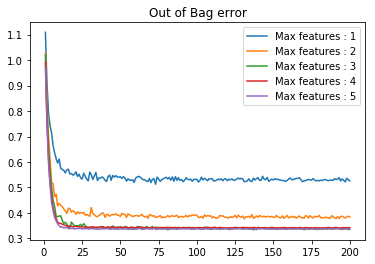

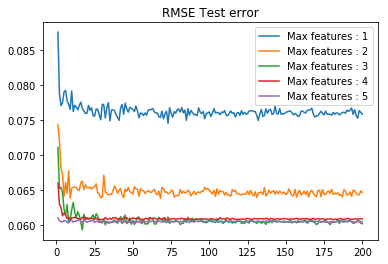

In [107]:
import matplotlib.pyplot as plt

for i in range(5):
    plt.plot(list(range(1,201)),oob_arr[i])
plt.title("Out of Bag error")
#plt.labels()
plt.legend(labels = ["Max features : " + str(i) for i in range(1,6)])
plt.show()
# for i in range(5):
#     plt.plot(list(range(1,201)),rmse_train_arr[i])
# plt.legend(labels = ["Max features : " + str(i) for i in range(1,6)])
# plt.title("RMSE Train error")
# plt.show()
for i in range(5):
    plt.plot(list(range(1,201)),rmse_test_arr[i])
plt.legend(labels = ["Max features : " + str(i) for i in range(1,6)])
plt.title("RMSE Test error")
plt.show()

import pickle
pickle.dump(rmse_train_arr,open("2brmsetrain", 'wb'))
 
pickle.dump(rmse_test_arr,open("2brmsetest", 'wb'))
 
pickle.dump(oob_arr,open("2boutofbag", 'wb'))

In [123]:
oob_arr = np.asarray(oob_arr)
min_index = np.argmin(oob_arr)
unraveled_index = np.unravel_index(min_index,oob_arr.shape)
best_feat = unraveled_index[0] + 1
print("Best value for max number of features: ",best_feat, unraveled_index)

Best value for max number of features:  3 (2, 136)


In [116]:
import warnings
from tqdm import tqdm
warnings.filterwarnings('ignore')
rmse_train_arr1, rmse_test_arr1, oob_arr1 = [],[],[]
#rmse_train, rmse_test, oob_error = randomForest(RF, Xs, ys)

i=0
for max_depth in tqdm(range(2,10)):
    rmse_train_arr1.append([])
    rmse_test_arr1.append([])
    oob_arr1.append([])
    for num_trees in tqdm(range(1,201)):
        RF = RandomForestRegressor(n_estimators = num_trees, max_depth = max_depth, max_features = best_feat, bootstrap = True, oob_score=True)
        a, b, c = randomForest(RF,Xs,ys)
        rmse_train_arr1[i].append(a)
        rmse_test_arr1[i].append(b)
        oob_arr1[i].append(c)
    i+=1

 48%|█████████████████████████████████████████████████████████████▊                                                                    | 95/200 [02:32<05:28,  3.13s/it]


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 191/200 [10:04<00:54,  6.08s/it]


 43%|███████████████████████████████████████████████████████▉                                                                          | 86/200 [02:30<06:26,  3.39s/it]


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 182/200 [14:10<03:38, 12.14s/it]


 38%|█████████████████████████████████████████████████▍                                                                                | 76/200 [04:28<11:38,  5.63s/it]


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 172/200 [23:54<08:26, 18.08s/it]


 33%|██████████████████████████████████████████▉                                                                                       | 66/200 [04:40<16:12,  7.26s/it]


 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 162/200 [27:00<13:06, 20.70s/it]


 28%|████████████████████████████████████▍                                                                                             | 56/200 [04:04<19:39,  8.19s/it]


 76%|████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 152/200 [3:15:50<07:30,  9.39s/it]


 23%|█████████████████████████████▉                                                                                                    | 46/200 [01:17<07:54,  3.08s/it]


 71%|███████████████████████████████████████████████████████████████████████████████████████████▌                                     | 142/200 [11:55<09:27,  9.79s/it]


 18%|███████████████████████▍                                                                                                          | 36/200 [00:52<07:27,  2.73s/it]


 66%|█████████████████████████████████████████████████████████████████████████████████████▏                                           | 132/200 [11:22<11:25, 10.09s/it]


 13%|████████████████▉                                                                                                                 | 26/200 [00:30<05:55,  2.04s/it]


 61%|██████████████████████████████████████████████████████████████████████████████▋                                                  | 122/200 [10:42<13:06, 10.08s/it]


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [6:35:56<00:00, 2740.97s/it]


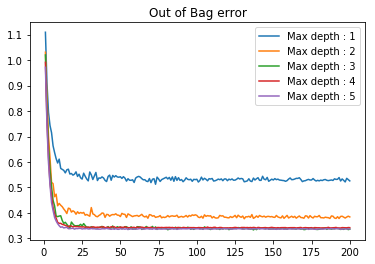

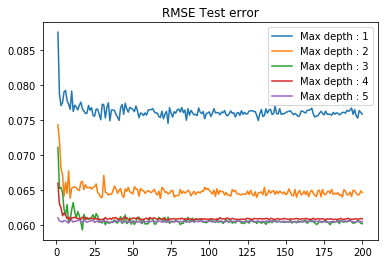

In [117]:
for i in range(5):
    plt.plot(list(range(1,201)),oob_arr[i])
plt.title("Out of Bag error")
#plt.labels()
plt.legend(labels = ["Max depth : " + str(i) for i in range(1,6)])
plt.show()
# for i in range(5):
#     plt.plot(list(range(1,201)),rmse_train_arr[i])
# plt.legend(labels = ["Max features : " + str(i) for i in range(1,6)])
# plt.title("RMSE Train error")
# plt.show()
for i in range(5):
    plt.plot(list(range(1,201)),rmse_test_arr[i])
plt.legend(labels = ["Max depth : " + str(i) for i in range(1,6)])
plt.title("RMSE Test error")
plt.show()

pickle.dump(rmse_train_arr1,open("2brmsetrain1", 'wb'))
 
pickle.dump(rmse_test_arr1,open("2brmsetest1", 'wb'))
 
pickle.dump(oob_arr1,open("2boutofbag1", 'wb'))

In [130]:
depths = list(range(2,10))
oob_arr1 = np.asarray(oob_arr1)
min_index = np.argmin(oob_arr1)
unraveled_index1 = np.unravel_index(min_index,oob_arr1.shape)
best_depth = depths[unraveled_index1[0]]
print("Best value for max depth: ",best_depth,unraveled_index1)


Best value for max depth:  9 (7, 194)


In [129]:
rmse0 = np.asarray(rmse_test_arr)
min_index = np.argmin(rmse0)
unraveled_index2 = np.unravel_index(min_index,rmse0.shape)
best_num_trees = unraveled_index2[1] + 1
print("Best value for tree number: ",best_num_trees,unraveled_index2, rmse0[unraveled_index2], oob_arr[unraveled_index2])

rmse1 = np.asarray(rmse_test_arr1)
min_index = np.argmin(rmse1)
unraveled_index3 = np.unravel_index(min_index,rmse1.shape)
best_num_trees = unraveled_index3[1] + 1
print("Best value for tree number: ",best_num_trees,unraveled_index3, rmse1[unraveled_index3],oob_arr1[unraveled_index3])



Best value for tree number:  17 (2, 16) 0.059303543018515203 0.34053664609190937
Best value for tree number:  199 (7, 198) 0.013903401173834724 0.017122756341582578


In [136]:
#Since the test rmse error value and oob error value for 199 trees is lower, we pick 199 trees, depth equal to 9 and max number of features = 3
best_trees = 199
best_depth = 9
best_max_feat = 3
best_RF = RandomForestRegressor(n_estimators = best_trees, max_depth = best_depth, max_features = best_max_feat, bootstrap = True, oob_score=True)
a, b, c = randomForest(best_RF,Xs,ys)

In [184]:
from sklearn import tree
print(best_RF.feature_importances_)
tree.export_graphviz(best_RF.estimators_[0], out_file='best_RF.dot', max_depth=4)

[0.00462859 0.27615695 0.3475489  0.16608088 0.20558468]


In [195]:
predictions = best_RF.predict(Xs)
x = np.arange(0, 1000,1)
#fitted versus actual
trace0 = go.Scatter(
    x = x,
    y = predictions,
    mode = 'markers',
    name = 'fitted value'
    )
trace1 = go.Scatter(
    x = x,
    y = ys,
    mode = 'markers',
    name = 'ground truth'
    )
data = [trace0, trace1]
py.offline.iplot(data)

In [197]:
#predictions = best_RF.predict(Xs)
#x = np.arange(0, 1000,1)

trace2 = go.Scatter(
    x = x,
    y = predictions,
    mode = 'markers',
    name = 'fitted value'
    )
trace3 = go.Scatter(
    x = x,
    y = ys - predictions,
    mode = 'markers',
    name = 'residual'
    )
data1 = [trace2, trace3]
py.offline.iplot(data1)

In [5]:
#tree plotted and saved in folder
#root of tree is X[4], not most important feature - understandable because we only plotted one tree. Forest feature importance will be calculated as a function of all 199 trees in the forest
def neuralnetwork(model, X, y):
    kf = KFold(n_splits=10)
    rmse_train, rmse_test = 0, 0
    for train_index, test_index in kf.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        model.fit(X_train, y_train)
        rmse_train += sqrt(mean_squared_error(y_train, model.predict(X_train)))
        rmse_test += sqrt(mean_squared_error(y_test, model.predict(X_test)))
    return rmse_train / 10, rmse_test / 10

In [6]:
#neural networks
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error as mse
enc = OneHotEncoder(sparse=False)
X_1hot = enc.fit_transform(Xs)
print(X_1hot.shape)

X_train, X_test, y_train, y_test = train_test_split(X_1hot, ys, train_size=0.9)
activations = ['relu','logistic','tanh']
hid_layers = [2, 5, 10]
hid_layers.extend(list(range(50,601,50)))

rmseTrain={act:[] for act in activations}
rmseTest={act:[] for act in activations}
i=0
for hid in tqdm(hid_layers):
    for act in activations:
        nn = MLPRegressor(hidden_layer_sizes=(hid, ), activation=act)
        a, b = neuralnetwork(nn, Xs, ys)
        rmseTrain[act].append(a)
        rmseTest[act].append(b)

(18588, 63)


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [1:13:36<00:00, 466.46s/it]


relu 550 0.05253909154068215
logistic 100 0.08650163861550912
tanh 150 0.0793149618026587


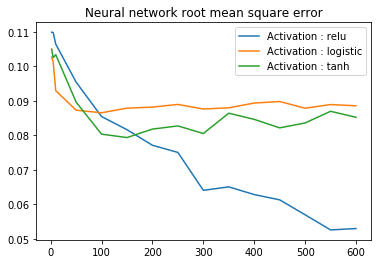

In [7]:
minima=[]
min_hidden=[]

for act in activations:
    min_hid = np.argmin(rmseTest[act])
    print(act, hid_layers[min_hid], rmseTest[act][min_hid])

for act in activations:
    plt.plot(hid_layers,rmseTest[act])
plt.title("Neural network root mean square error")
#plt.labels()
plt.legend(labels = ["Activation : " + i for i in activations])
plt.show()
#Best value for rmse error given by 450 hidden units and relu activation

In [9]:
best_NN = MLPRegressor(hidden_layer_sizes=(550, ), activation='relu')
best_NN.fit(X_train, y_train)
predictions_nn = best_NN.predict(X_1hot)
x = np.arange(0, 1000,1)
#fitted versus actual
trace0 = go.Scatter(
    x = x,
    y = predictions_nn,
    mode = 'markers',
    name = 'fitted value'
    )
trace1 = go.Scatter(
    x = x,
    y = ys,
    mode = 'markers',
    name = 'ground truth'
    )
data3 = [trace0, trace1]
py.offline.iplot(data3)

In [10]:
#predictions = best_RF.predict(Xs)
#x = np.arange(0, 1000,1)

trace2 = go.Scatter(
    x = x,
    y = predictions_nn,
    mode = 'markers',
    name = 'fitted value'
    )
trace3 = go.Scatter(
    x = x,
    y = ys - predictions_nn,
    mode = 'markers',
    name = 'residual'
    )
data4 = [trace2, trace3]
py.offline.iplot(data4)